In [1]:
import os
import sys
sys.path.insert(1, '../../Src/')
import numpy as np
from utils import preprocessing
from models import training
from models import models
from utils import make_report
import warnings
warnings.filterwarnings('ignore')

import numpy             as np
import pandas            as pd
import seaborn           as sns
import matplotlib.pyplot as plt

%matplotlib inline

plt.rcParams['figure.dpi'] = 100


PATH_DATA          = '../../Data/'
PATH_MODEL         = '../../Results/Models/'
PATH_RESULTS = '../../Results/'


FNMAME             = "stringer_spontaneous.npy"
FEATURES           = "sresp"


THRESHOLDING_FLAG  = False
THRESHOLDING_MAX   = 95  # 95%


NORMALIZATION_FLAG = True
TEST_SIZE          = 0.2

PCA_FLAG           = True



N_SPLITS = 5


np.random.seed(42)

%matplotlib inline
%load_ext autoreload 
%autoreload 2

In [2]:
TARGET = "run"
X,y = preprocessing.get_dataset(PATH_DATA,FNMAME,FEATURES,TARGET)


dict_keys(['sresp', 'run', 'beh_svd_time', 'beh_svd_mask', 'stat', 'pupilArea', 'pupilCOM', 'xyz'])
 X size : (7018, 11983)
 y size : (7018, 1)


In [3]:
import pandas as pd

df = pd.DataFrame(X)
df = df.add_prefix('neuron_')
neurons_names = list(df.columns)
df['speed'] = y


In [4]:
df.head()

,neuron_0,neuron_1,neuron_2,neuron_3,neuron_4,neuron_5,neuron_6,neuron_7,neuron_8,neuron_9,...,neuron_11974,neuron_11975,neuron_11976,neuron_11977,neuron_11978,neuron_11979,neuron_11980,neuron_11981,neuron_11982,speed
0,2.982083,5.001608,7.689009,7.469154,10.461974,0.927082,50.330318,30.159632,8.333404,0.000000,...,85.968636,7.782515,46.044064,37.873295,0.000000,84.098610,91.947937,0.000000,1.149018,0.043625
1,8.409119,9.838382,4.740472,5.175084,0.000000,10.437500,35.504055,0.000000,0.000000,6.130369,...,41.872601,94.723061,156.175797,27.474876,133.711212,0.000000,14.375244,43.836548,1.832320,5.688507
2,12.720393,4.246386,3.765824,7.111603,8.659038,0.000000,0.000000,39.374569,0.000000,0.000000,...,150.307175,46.499390,186.136032,99.228111,111.635338,39.376881,78.326202,139.181580,4.561337,9.130915
3,0.000000,3.744134,7.232076,14.160844,1.334573,0.000000,29.671076,0.000000,18.217936,0.000000,...,137.551041,30.205742,0.000000,3.665486,87.892609,119.110176,0.000000,185.570602,3.653614,16.939346
4,0.000000,16.891184,0.000000,0.000000,14.634576,0.000000,0.000000,33.021465,1.476410,13.096520,...,138.852921,58.308487,103.963585,39.160198,0.000000,0.000000,34.821697,0.000000,0.794143,17.465670


In [5]:
df['time'] = np.array([i for i in range(len(df))])*1.2

In [6]:
df["speed_level"] = 'no movement'

In [7]:
df["speed_level"][df["speed"]>0] = pd.qcut(df["speed"][df["speed"]>0], q=[0,.33,.66,.99,1], labels=['low','medium','high','very_high'])
df["speed_level"].value_counts()

no movement    2226
low            1582
medium         1581
high           1581
very_high        48
Name: speed_level, dtype: int64

In [8]:
total_sresp = df["speed"][df["speed"]>0]
for percentile in [33,66,99,100]:
    print('percentile '+str(percentile)+': ',np.round(np.percentile(total_sresp, percentile),4))

percentile 33:  0.0279
percentile 66:  2.7946
percentile 99:  42.1078
percentile 100:  57.5542


In [9]:
df['speed'].value_counts()

0.000000     2226
0.043625        1
0.000983        1
0.009977        1
0.008108        1
             ... 
3.599856        1
18.240590       1
16.356795       1
7.684696        1
7.664720        1
Name: speed, Length: 4793, dtype: int64

<Figure size 576x360 with 0 Axes>

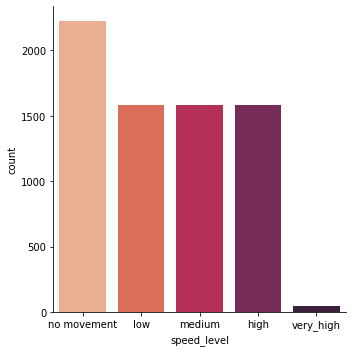

In [10]:
fig = plt.figure(figsize=(8,5))

PALETTE_COLOR = "rocket_r"

g = sns.catplot(x="speed_level", kind="count", palette=PALETTE_COLOR, data=df,order=df.speed_level.value_counts().index)


[Text(0.5, 1.0, 'Running speed outliers')]

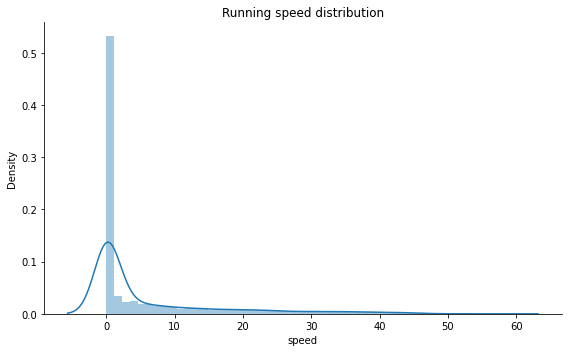

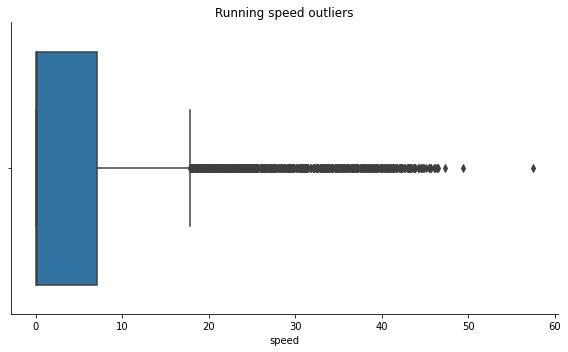

In [11]:
fig = plt.figure(figsize=(8,5))
#sns.relplot(x='time', y='speed', ci=None, kind='line', color='blue', data=df)
sns.distplot(df["speed"][df["speed"]>0]).set_title('Running speed distribution')
#plt.xlim(0,1000)
fig = plt.figure(figsize=(8,5))

sns.boxplot(x='speed', data=df[df["speed"]>0], ).set(title='Running speed outliers') 


Text(0.5, 0.98, 'speed level box plot distribution')

<Figure size 576x360 with 0 Axes>

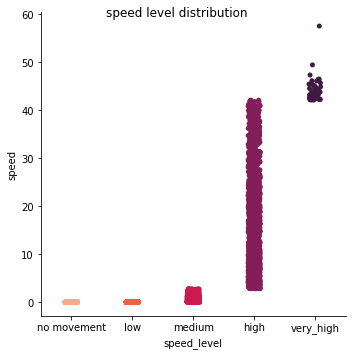

<Figure size 576x360 with 0 Axes>

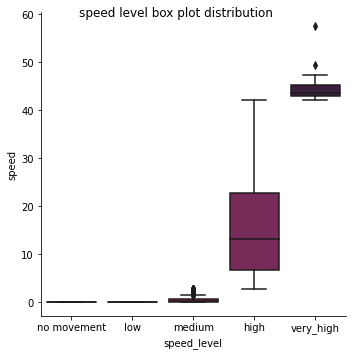

In [12]:
fig = plt.figure(figsize=(8,5))
ax = sns.catplot(x="speed_level", y="speed", palette=PALETTE_COLOR,data=df,order=['no movement','low','medium','high','very_high'])

ax.fig.suptitle("speed level distribution")

fig = plt.figure(figsize=(8,5))

ax = sns.catplot(x="speed_level", y="speed", palette=PALETTE_COLOR, kind="box", data=df,order=['no movement','low','medium','high','very_high'])
ax.fig.suptitle("speed level box plot distribution")

Text(0.5, 1.0, 'Running speed')

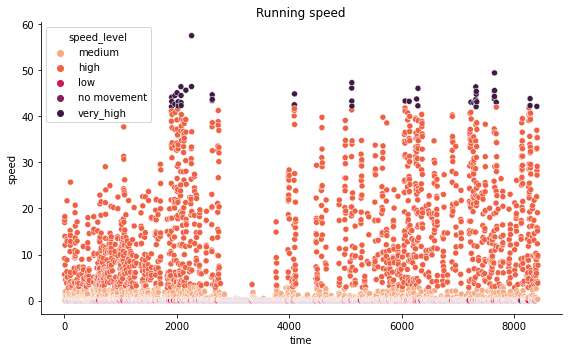

In [13]:
#plt.plot(sorted(df['speed'][df["speed"]>0]))
fig = plt.figure(figsize=(8,5))


# group by time and show the groups with different colors
ax = sns.scatterplot(x ='time', y ='speed', data = df, hue= 'speed_level',palette=PALETTE_COLOR)
ax.set_title("Running speed")

In [14]:
neurons_names[:5]

['neuron_0', 'neuron_1', 'neuron_2', 'neuron_3', 'neuron_4']

In [15]:
df.head()

,neuron_0,neuron_1,neuron_2,neuron_3,neuron_4,neuron_5,neuron_6,neuron_7,neuron_8,neuron_9,...,neuron_11976,neuron_11977,neuron_11978,neuron_11979,neuron_11980,neuron_11981,neuron_11982,speed,time,speed_level
0,2.982083,5.001608,7.689009,7.469154,10.461974,0.927082,50.330318,30.159632,8.333404,0.000000,...,46.044064,37.873295,0.000000,84.098610,91.947937,0.000000,1.149018,0.043625,0.0,medium
1,8.409119,9.838382,4.740472,5.175084,0.000000,10.437500,35.504055,0.000000,0.000000,6.130369,...,156.175797,27.474876,133.711212,0.000000,14.375244,43.836548,1.832320,5.688507,1.2,high
2,12.720393,4.246386,3.765824,7.111603,8.659038,0.000000,0.000000,39.374569,0.000000,0.000000,...,186.136032,99.228111,111.635338,39.376881,78.326202,139.181580,4.561337,9.130915,2.4,high
3,0.000000,3.744134,7.232076,14.160844,1.334573,0.000000,29.671076,0.000000,18.217936,0.000000,...,0.000000,3.665486,87.892609,119.110176,0.000000,185.570602,3.653614,16.939346,3.6,high
4,0.000000,16.891184,0.000000,0.000000,14.634576,0.000000,0.000000,33.021465,1.476410,13.096520,...,103.963585,39.160198,0.000000,0.000000,34.821697,0.000000,0.794143,17.465670,4.8,high


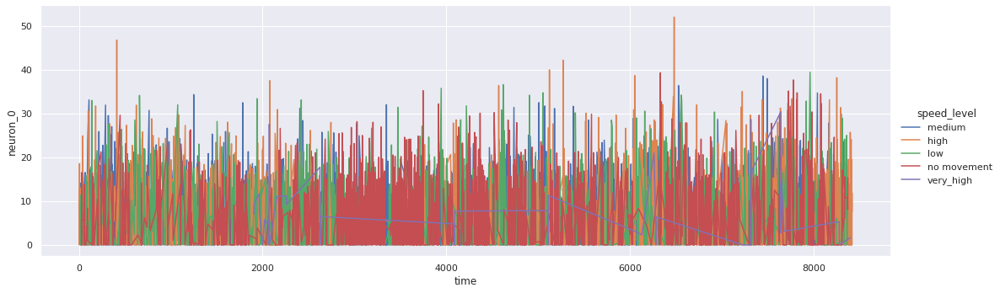

In [16]:
import seaborn as sns

sns.set(rc = {'figure.figsize':(15,8)})

#f, ax = plt.subplots(figsize=(15,6))
sns.relplot(x='time', y='neuron_0', hue='speed_level', kind='line', data=df,height=5,aspect=3)
plt.show()

In [17]:
df

,neuron_0,neuron_1,neuron_2,neuron_3,neuron_4,neuron_5,neuron_6,neuron_7,neuron_8,neuron_9,...,neuron_11976,neuron_11977,neuron_11978,neuron_11979,neuron_11980,neuron_11981,neuron_11982,speed,time,speed_level
0,2.982083,5.001608,7.689009,7.469154,10.461974,0.927082,50.330318,30.159632,8.333404,0.000000,...,46.044064,37.873295,0.000000,84.098610,91.947937,0.000000,1.149018,0.043625,0.0,medium
1,8.409119,9.838382,4.740472,5.175084,0.000000,10.437500,35.504055,0.000000,0.000000,6.130369,...,156.175797,27.474876,133.711212,0.000000,14.375244,43.836548,1.832320,5.688507,1.2,high
2,12.720393,4.246386,3.765824,7.111603,8.659038,0.000000,0.000000,39.374569,0.000000,0.000000,...,186.136032,99.228111,111.635338,39.376881,78.326202,139.181580,4.561337,9.130915,2.4,high
3,0.000000,3.744134,7.232076,14.160844,1.334573,0.000000,29.671076,0.000000,18.217936,0.000000,...,0.000000,3.665486,87.892609,119.110176,0.000000,185.570602,3.653614,16.939346,3.6,high
4,0.000000,16.891184,0.000000,0.000000,14.634576,0.000000,0.000000,33.021465,1.476410,13.096520,...,103.963585,39.160198,0.000000,0.000000,34.821697,0.000000,0.794143,17.465670,4.8,high
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7013,12.836020,0.000000,5.315800,51.976223,8.519535,7.629037,0.000000,41.609097,6.809843,0.000000,...,45.195744,57.428375,54.842514,55.034931,71.024422,0.000000,0.223907,4.055289,8415.6,high
7014,13.076774,8.318789,1.833244,17.885351,32.273228,0.000000,17.923410,0.000000,0.000000,16.460527,...,89.493095,141.395325,10.781943,20.041687,33.460781,93.172417,3.025923,0.269357,8416.8,medium
7015,0.000000,0.000000,6.516010,0.000000,0.000000,2.057358,2.886552,16.453707,0.000000,0.283618,...,0.000000,0.000000,61.965534,59.920879,0.000000,98.847816,0.000000,3.768623,8418.0,high
7016,11.900859,0.000000,4.359752,0.286546,8.920449,5.236804,3.138117,10.401705,11.087155,4.383934,...,231.639603,111.018181,144.991989,63.978939,38.051830,0.000000,3.276081,9.793047,8419.2,high


Text(0.5, 0.98, 'neuron 0 activity distribution')

<Figure size 576x360 with 0 Axes>

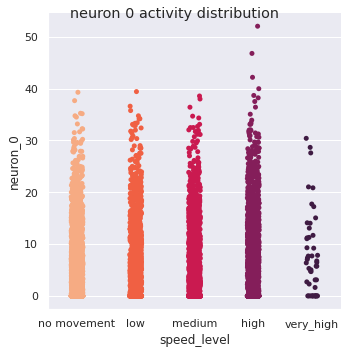

<Figure size 576x360 with 0 Axes>

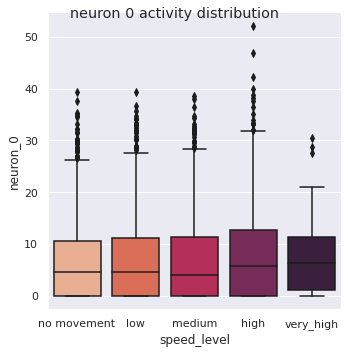

In [18]:
fig = plt.figure(figsize=(8,5))
ax = sns.catplot(x="speed_level", y="neuron_0", palette=PALETTE_COLOR,data=df,order=['no movement','low','medium','high','very_high'])

ax.fig.suptitle("neuron 0 activity distribution")

fig = plt.figure(figsize=(8,5))

ax = sns.catplot(x="speed_level", y="neuron_0", palette=PALETTE_COLOR, kind="box", data=df,order=['no movement','low','medium','high','very_high'])
ax.fig.suptitle("neuron 0 activity distribution")

Text(0.5, 0.98, 'neuron 10 activity distribution')

<Figure size 576x360 with 0 Axes>

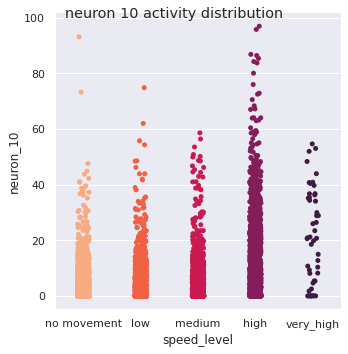

<Figure size 576x360 with 0 Axes>

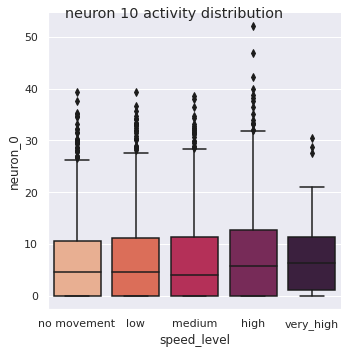

In [19]:
fig = plt.figure(figsize=(8,5))
ax = sns.catplot(x="speed_level", y="neuron_10", palette=PALETTE_COLOR,data=df,order=['no movement','low','medium','high','very_high'])

ax.fig.suptitle("neuron 10 activity distribution")

fig = plt.figure(figsize=(8,5))

ax = sns.catplot(x="speed_level", y="neuron_0", palette=PALETTE_COLOR, kind="box", data=df,order=['no movement','low','medium','high','very_high'])
ax.fig.suptitle("neuron 10 activity distribution")

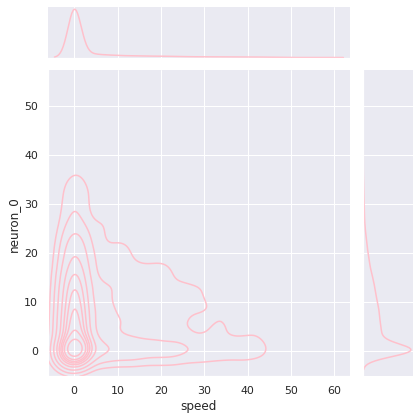

In [20]:
sns.jointplot(x='speed', y='neuron_0', data=df, kind='kde', color='pink')


In [21]:
import matplotlib.pyplot as plt
# Option 1
plt.rcParams['font.size'] = 30

Text(0.5, 1.0, 'Neuron 0 activity')

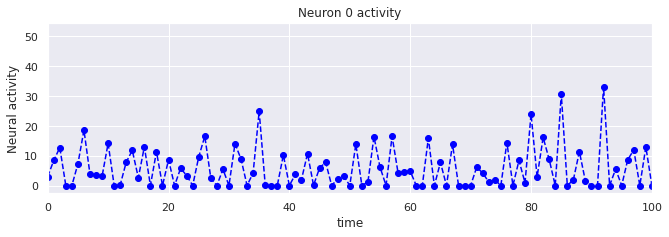

In [22]:
plt.figure(figsize=(10,4))
plt.plot(df['neuron_0'],'--o', color='blue')
plt.xlabel('time')
plt.ylabel('Neural activity')
plt.xlim(0,100)
plt.title('Neuron 0 activity')

In [23]:
import statsmodels.api as sm
import statsmodels.tsa.api as smt
import statsmodels.formula.api as smf
from scipy.ndimage import gaussian_filter1d


Text(0.5, 1.0, 'Neuron 0 activity')

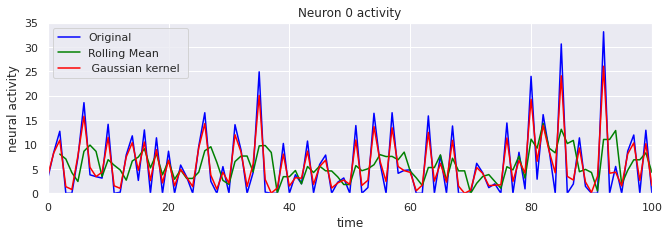

In [24]:
plt.figure(figsize=(10,4))
rolling_data = df['neuron_0'].rolling(window=3).mean()
gaussian_data = gaussian_filter1d(df['neuron_0'],0.5)


plt.plot(df['neuron_0'], color='blue', label='Original')
plt.plot(rolling_data, color='green', label='Rolling Mean')
plt.plot(gaussian_data, color='red', label=' Gaussian kernel ')

plt.legend(loc='best')
plt.xlim(0,100)
plt.ylim(0,35)

plt.xlabel('time')
plt.ylabel('neural activity')

plt.title('Neuron 0 activity')

Text(0.5, 1.0, 'Neuron 1 activity')

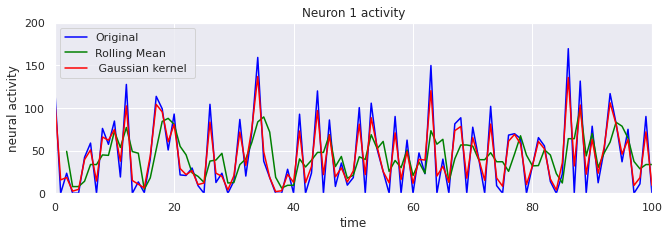

In [25]:
plt.figure(figsize=(10,4))
rolling_data = df['neuron_1000'].rolling(window=3).mean()
gaussian_data = gaussian_filter1d(df['neuron_1000'],0.5)


plt.plot(df['neuron_1000'], color='blue', label='Original')
plt.plot(rolling_data, color='green', label='Rolling Mean')
plt.plot(gaussian_data, color='red', label=' Gaussian kernel ')

plt.legend(loc='best')
plt.xlim(0,100)
plt.ylim(0,200)

plt.xlabel('time')
plt.ylabel('neural activity')

plt.title('Neuron 1 activity')

In [26]:
df.head()

,neuron_0,neuron_1,neuron_2,neuron_3,neuron_4,neuron_5,neuron_6,neuron_7,neuron_8,neuron_9,...,neuron_11976,neuron_11977,neuron_11978,neuron_11979,neuron_11980,neuron_11981,neuron_11982,speed,time,speed_level
0,2.982083,5.001608,7.689009,7.469154,10.461974,0.927082,50.330318,30.159632,8.333404,0.000000,...,46.044064,37.873295,0.000000,84.098610,91.947937,0.000000,1.149018,0.043625,0.0,medium
1,8.409119,9.838382,4.740472,5.175084,0.000000,10.437500,35.504055,0.000000,0.000000,6.130369,...,156.175797,27.474876,133.711212,0.000000,14.375244,43.836548,1.832320,5.688507,1.2,high
2,12.720393,4.246386,3.765824,7.111603,8.659038,0.000000,0.000000,39.374569,0.000000,0.000000,...,186.136032,99.228111,111.635338,39.376881,78.326202,139.181580,4.561337,9.130915,2.4,high
3,0.000000,3.744134,7.232076,14.160844,1.334573,0.000000,29.671076,0.000000,18.217936,0.000000,...,0.000000,3.665486,87.892609,119.110176,0.000000,185.570602,3.653614,16.939346,3.6,high
4,0.000000,16.891184,0.000000,0.000000,14.634576,0.000000,0.000000,33.021465,1.476410,13.096520,...,103.963585,39.160198,0.000000,0.000000,34.821697,0.000000,0.794143,17.465670,4.8,high


In [27]:
target_correlation = df[neurons_names].apply(lambda x: x.corr(df['speed']))

In [28]:
target_correlation.sort_values(ascending=False)

neuron_2801     0.671524
neuron_247      0.636406
neuron_3873     0.618055
neuron_2404     0.608758
neuron_3672     0.604159
                  ...   
neuron_11165   -0.221935
neuron_4185    -0.222140
neuron_455     -0.234830
neuron_6806    -0.238356
neuron_1680    -0.243506
Length: 11983, dtype: float64

In [29]:
best_neurons  = target_correlation[target_correlation>0.5]

In [47]:
%matplotlib inline

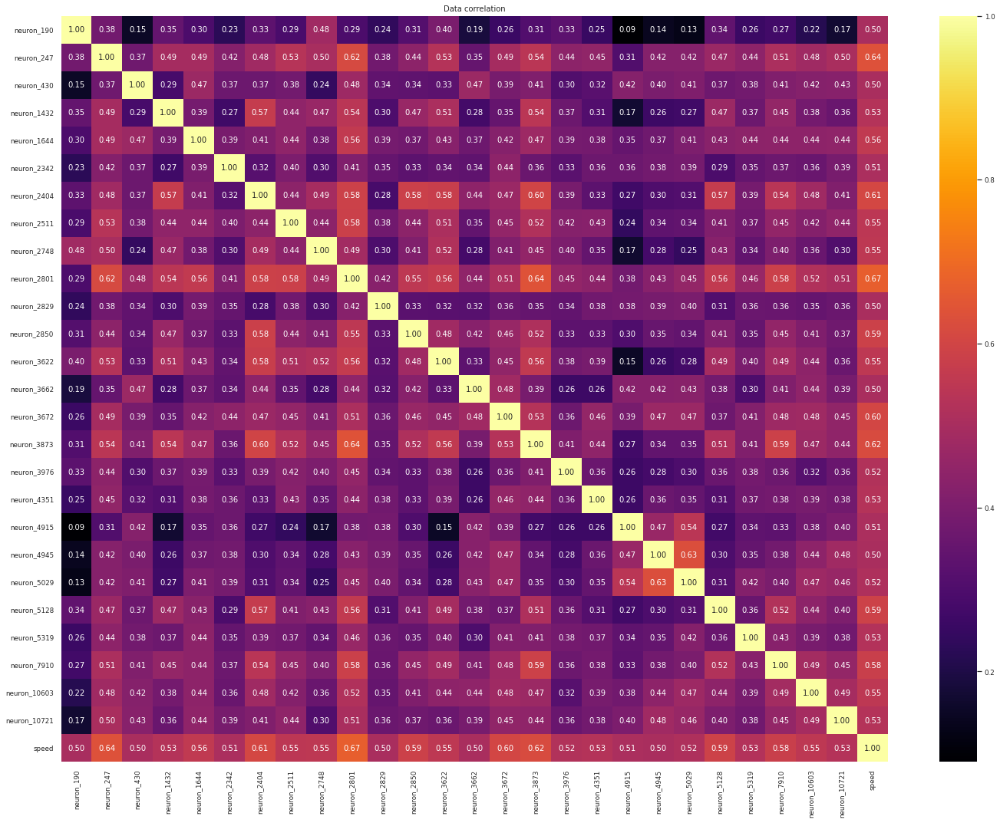

In [48]:
corr_matrix = df[list(best_neurons.index)+['speed','speed_level']].corr()
fig, ax = plt.subplots(figsize=(20, 15))

ax = sns.heatmap(corr_matrix,
                 annot=True,
                 fmt=".2f",
                 cmap="inferno"); #bone cmap type

plt.title('Data correlation', fontsize = 10)
bottom, top = ax.get_ylim()
sns.set(font_scale=0.8)


In [49]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.decomposition import PCA
from umap import UMAP
from matplotlib import rcParams

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

PATH_DATA = '../../Data/'

fname = "stringer_spontaneous.npy"
fname =os.path.join(PATH_DATA,fname)

# @title Data loading
dat = np.load(fname, allow_pickle=True).item()
print(dat.keys())

dict_keys(['sresp', 'run', 'beh_svd_time', 'beh_svd_mask', 'stat', 'pupilArea', 'pupilCOM', 'xyz'])


In [52]:
%matplotlib inline

In [53]:
dat['sresp'].shape

(11983, 7018)

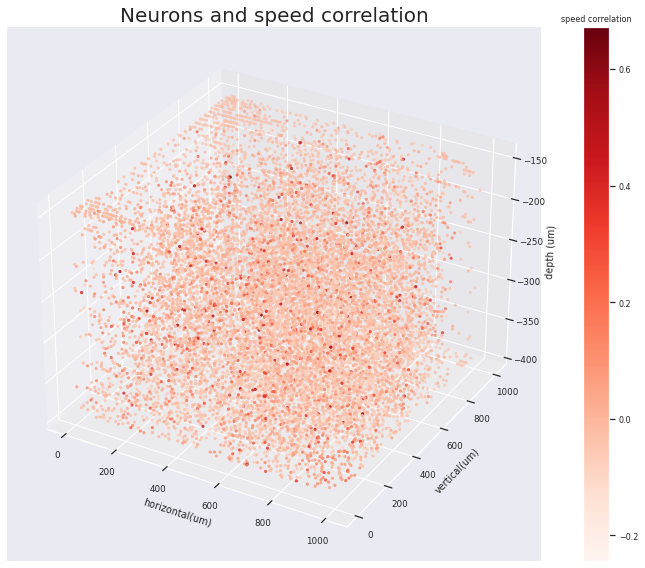

In [54]:
# Import libraries

from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
# Define Dataset

x, y, z = dat['xyz']

# Creating figure

fig = plt.figure(figsize = (12, 8))
ax = plt.axes(projection ="3d")
  
# Creat color map
intensity = target_correlation#(target_correlation-target_correlation.mean())/target_correlation.std()
#dat['sresp'][:,7017]
scatter_plot = ax.scatter3D(x, y, z,
                            c=intensity, s=5,
                            cmap=plt.get_cmap('Reds')
                            )

ax.set(xlabel='horizontal(um)', ylabel='vertical(um)', zlabel='depth (um)')

clb = plt.colorbar(scatter_plot, shrink =1, aspect = 20)
clb.ax.tick_params(labelsize=8) 
clb.ax.set_title('speed correlation',fontsize=8)

plt.title('Neurons and speed correlation', fontsize=20)
plt.show()

In [55]:
df_neurons = pd.DataFrame(x,columns=['x'])
df_neurons['y'] = y
df_neurons['z'] = z
df_neurons['speed_correlation'] = target_correlation.values
df_neurons.head()

,x,y,z,speed_correlation
0,174.0,6.0,-150.0,0.054917
1,220.0,4.0,-150.0,-0.011551
2,18.0,16.0,-150.0,-0.011675
3,128.0,18.0,-150.0,0.046078
4,680.0,16.0,-150.0,0.048107


In [56]:
layers = df_neurons['z'].value_counts().index.values
layers

array([-300., -360., -330., -270., -390., -240., -210., -180., -150.])

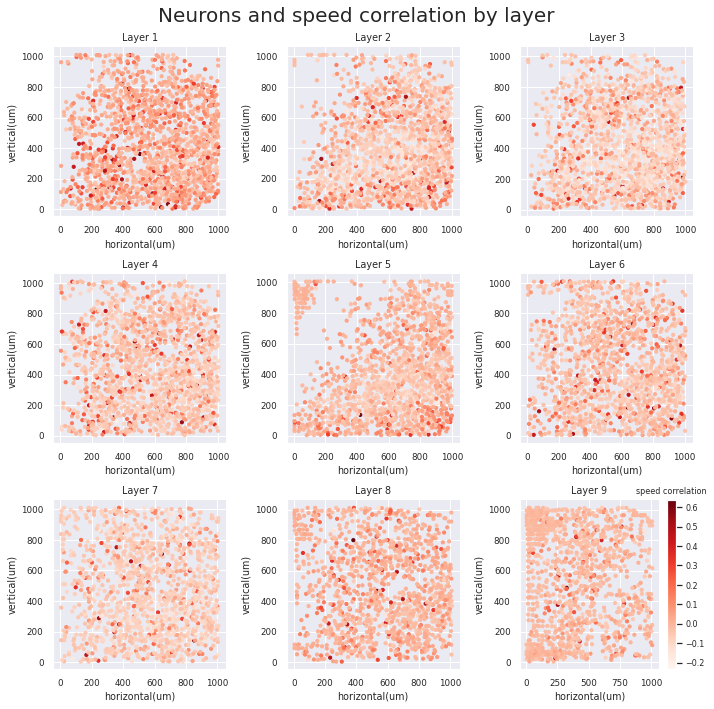

In [57]:
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10,10))

for idx, layer in enumerate(layers):
    plt.subplot(3,3,idx+1)
    x_aux = df_neurons['x'][df_neurons['z']==layer]
    y_aux = df_neurons['y'][df_neurons['z']==layer]
    correlation_aux = df_neurons['speed_correlation'][df_neurons['z']==layer]

    scatter_plot = plt.scatter(x_aux, y_aux, c=correlation_aux,cmap=plt.get_cmap('Reds'),s=10)
    plt.xlabel('horizontal(um)')
    plt.ylabel('vertical(um)')

    plt.title('Layer '+str(idx+1))
    

clb = plt.colorbar(scatter_plot, shrink =1, aspect = 20)
clb.ax.tick_params(labelsize=8) 
clb.ax.set_title('speed correlation',fontsize=8)

plt.suptitle('Neurons and speed correlation by layer', fontsize=20)
plt.show()

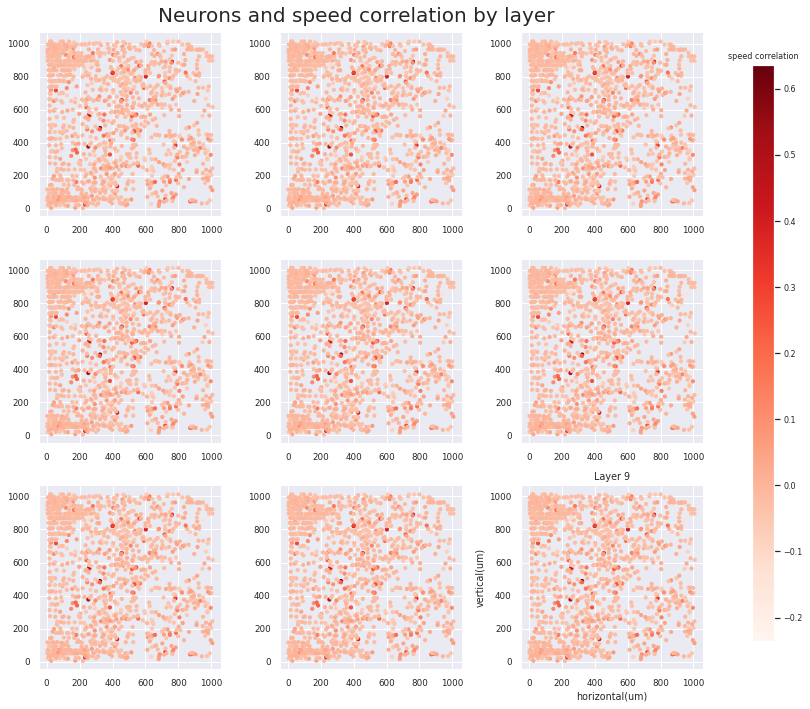

In [58]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl


fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(10,10))

for idx,ax in enumerate(axes.flat):
    
    #for idx, layer in enumerate(layers):
    #plt.subplot(3,3,idx+1)
    x_aux = df_neurons['x'][df_neurons['z']==layer]
    y_aux = df_neurons['y'][df_neurons['z']==layer]
    correlation_aux = df_neurons['speed_correlation'][df_neurons['z']==layer]

    scatter_plot = ax.scatter(x_aux, y_aux, c=correlation_aux,cmap=plt.get_cmap('Reds'),s=10)
    plt.xlabel('horizontal(um)')
    plt.ylabel('vertical(um)')

    plt.title('Layer '+str(idx+1))


cbaxes = fig.add_axes([1.05, 0.1, 0.03, 0.8])  # This is the position for the colorbar

clb = plt.colorbar(scatter_plot, cax=cbaxes)
clb.ax.tick_params(labelsize=8) 
clb.ax.set_title('speed correlation',fontsize=8)

plt.suptitle('Neurons and speed correlation by layer', fontsize=20)
plt.show()

In [59]:
def get_layer(x):
    for idx,layer in enumerate(layers):
        if x==layer:
            return 'layer '+str(idx)

In [60]:
df_neurons['layer'] = df_neurons['z'].apply(get_layer)

In [61]:
df_neurons.head()

,x,y,z,speed_correlation,layer
0,174.0,6.0,-150.0,0.054917,layer 8
1,220.0,4.0,-150.0,-0.011551,layer 8
2,18.0,16.0,-150.0,-0.011675,layer 8
3,128.0,18.0,-150.0,0.046078,layer 8
4,680.0,16.0,-150.0,0.048107,layer 8


Text(0.5, 0.98, 'Neural activity by layer ')

<Figure size 360x360 with 0 Axes>

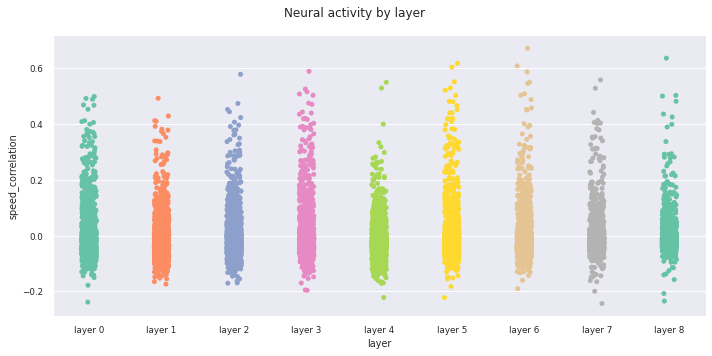

<Figure size 360x360 with 0 Axes>

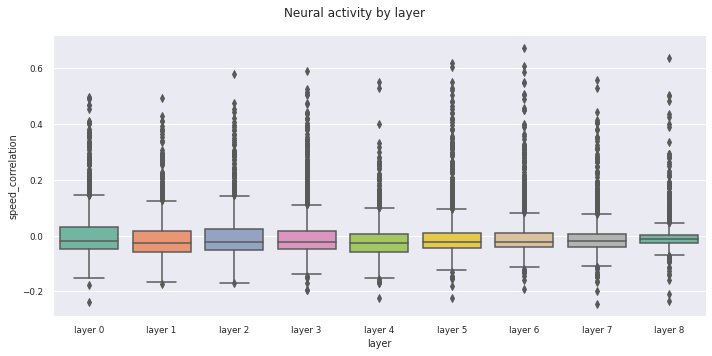

In [62]:
fig = plt.figure(figsize=(5,5))
ax = sns.catplot(x="layer", y="speed_correlation", palette='Set2',data=df_neurons,
                 order=sorted(df_neurons['layer'].unique()), height=5, aspect=2)
ax.fig.subplots_adjust(top=0.9) # adjust the Figure in rp

ax.fig.suptitle("Neural activity by layer ")

fig = plt.figure(figsize=(5,5))

ax = sns.catplot(x="layer", y="speed_correlation", palette='Set2', kind="box", data=df_neurons,
                 order=sorted(df_neurons['layer'].unique()), height=5, aspect=2)
ax.fig.subplots_adjust(top=0.9) # adjust the Figure in rp

ax.fig.suptitle("Neural activity by layer ")

In [63]:
from sklearn.cluster import KMeans
import tqdm

In [64]:
def kmeans(numero_de_cluster,generos):
    modelo = KMeans(n_clusters=numero_de_cluster)
    modelo.fit(generos)
    return [numero_de_cluster,modelo.inertia_]

In [66]:
df_neurons

,x,y,z,speed_correlation,layer
0,174.0,6.0,-150.0,0.054917,layer 8
1,220.0,4.0,-150.0,-0.011551,layer 8
2,18.0,16.0,-150.0,-0.011675,layer 8
3,128.0,18.0,-150.0,0.046078,layer 8
4,680.0,16.0,-150.0,0.048107,layer 8
...,...,...,...,...,...
11978,804.0,494.0,-390.0,-0.030765,layer 4
11979,666.0,504.0,-390.0,-0.004624,layer 4
11980,806.0,510.0,-390.0,-0.002614,layer 4
11981,944.0,638.0,-390.0,-0.025612,layer 4


In [67]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
variaveis_escaladas = scaler.fit_transform(df_neurons[['x','y','z','speed_correlation']])

In [68]:
results = [kmeans(numero_de_grupos,variaveis_escaladas) for numero_de_grupos in range(1,41)]

In [69]:
df_inertia = pd.DataFrame(results,columns=['groups','inertia'])

Text(0.5, 0.98, 'Kmeans inertia')

<Figure size 576x360 with 0 Axes>

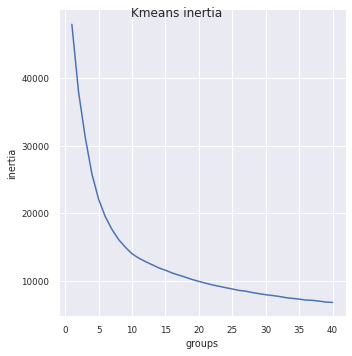

In [70]:

fig = plt.figure(figsize=(8,5))

ax = sns.relplot(x='groups', y='inertia', kind='line', ci="sd", data=df_inertia)
ax.fig.suptitle("Kmeans inertia")

In [71]:
km = KMeans(n_clusters=10)
y_predicted = km.fit_predict(variaveis_escaladas)
df_neurons['cluster'] = y_predicted

In [72]:
import plotly.express as px

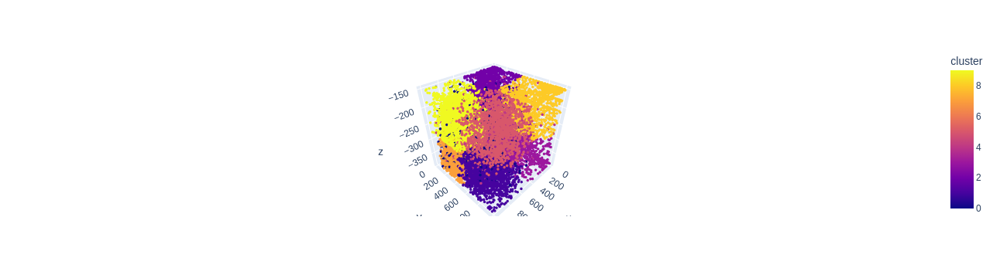

In [73]:
fig = px.scatter_3d(df_neurons, x='x', y='y', z='z',
              color='cluster',size_max = 0.1, color_discrete_sequence=px.colors.qualitative.T10)

fig.update_traces(marker_size = 2)

fig.show()

In [74]:
# Import the necessaries libraries
import plotly.offline as pyo
import plotly.graph_objs as go
# Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.io as pio
pio.renderers.default = 'iframe'

Text(0.5, 0.98, 'Neural activity by layer ')

<Figure size 360x360 with 0 Axes>

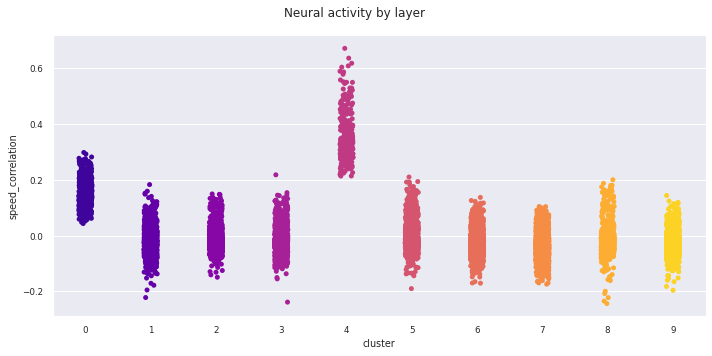

<Figure size 360x360 with 0 Axes>

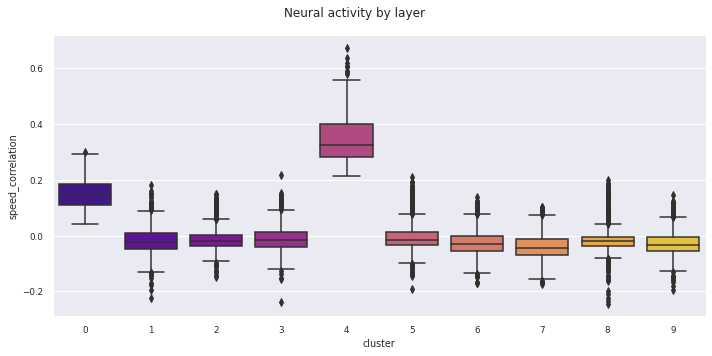

In [75]:
fig = plt.figure(figsize=(5,5))
ax = sns.catplot(x="cluster", y="speed_correlation", palette='plasma',data=df_neurons,
                 order=sorted(df_neurons['cluster'].unique()), height=5, aspect=2)
ax.fig.subplots_adjust(top=0.9) # adjust the Figure in rp

ax.fig.suptitle("Neural activity by layer ")

fig = plt.figure(figsize=(5,5))

ax = sns.catplot(x="cluster", y="speed_correlation", palette='plasma', kind="box", data=df_neurons,
                 order=sorted(df_neurons['cluster'].unique()), height=5, aspect=2)
ax.fig.subplots_adjust(top=0.9) # adjust the Figure in rp

ax.fig.suptitle("Neural activity by layer ")

In [76]:
df_neurons.head()

,x,y,z,speed_correlation,layer,cluster
0,174.0,6.0,-150.0,0.054917,layer 8,2
1,220.0,4.0,-150.0,-0.011551,layer 8,2
2,18.0,16.0,-150.0,-0.011675,layer 8,2
3,128.0,18.0,-150.0,0.046078,layer 8,2
4,680.0,16.0,-150.0,0.048107,layer 8,9


In [77]:
%matplotlib inline

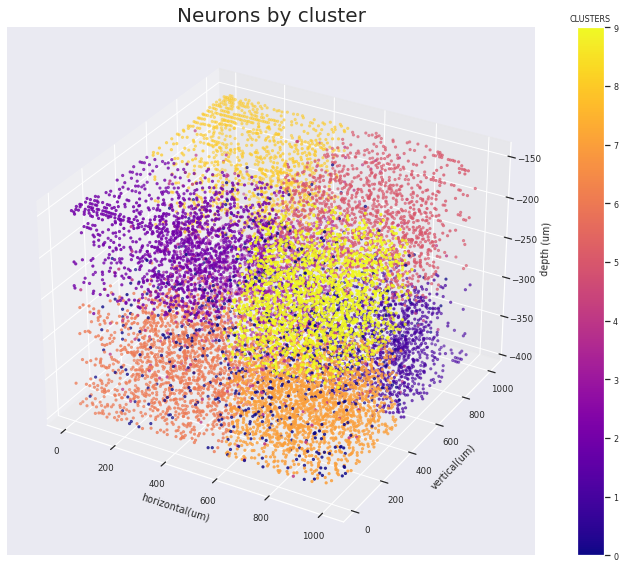

In [78]:
x = df_neurons['x']
y = df_neurons['y']
z = df_neurons['z']
intensity = df_neurons['cluster']


fig = plt.figure(figsize = (12, 8))
ax = plt.axes(projection ="3d")
  
#dat['sresp'][:,7017]
scatter_plot = ax.scatter3D(x, y, z,
                            c=intensity, s=5,
                            cmap=plt.get_cmap('plasma')
                            )

ax.set(xlabel='horizontal(um)', ylabel='vertical(um)', zlabel='depth (um)')

clb = plt.colorbar(scatter_plot, shrink =1, aspect = 20)
clb.ax.tick_params(labelsize=8) 
clb.ax.set_title('CLUSTERS',fontsize=8)

plt.title('Neurons by cluster', fontsize=20)
plt.show()

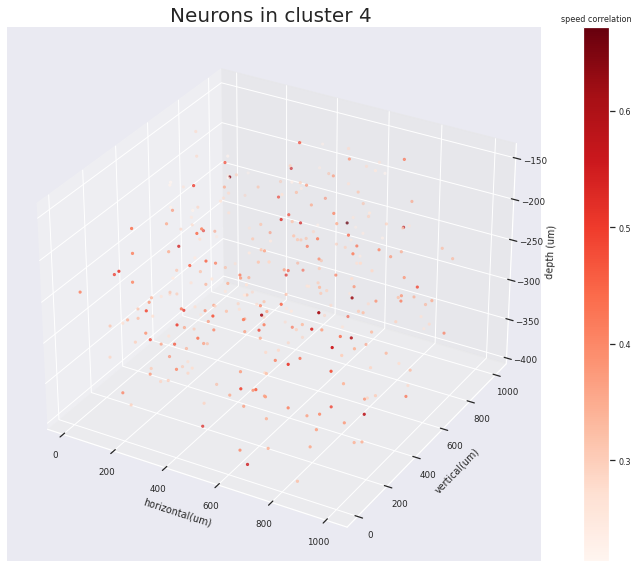

In [79]:
x = df_neurons['x'][df_neurons['cluster']==4]
y = df_neurons['y'][df_neurons['cluster']==4]
z = df_neurons['z'][df_neurons['cluster']==4]
intensity = df_neurons['speed_correlation'][df_neurons['cluster']==4]


fig = plt.figure(figsize = (12, 8))
ax = plt.axes(projection ="3d")
  
#dat['sresp'][:,7017]
scatter_plot = ax.scatter3D(x, y, z,
                            c=intensity, s=5,
                            cmap=plt.get_cmap('Reds')
                            )

ax.set(xlabel='horizontal(um)', ylabel='vertical(um)', zlabel='depth (um)')

clb = plt.colorbar(scatter_plot, shrink =1, aspect = 20)
clb.ax.tick_params(labelsize=8) 
clb.ax.set_title('speed correlation',fontsize=8)

plt.title('Neurons in cluster 4 ', fontsize=20)
plt.show()

In [80]:
from scipy.ndimage import gaussian_filter1d


In [81]:
df_original = df.copy()
df_processed = df.copy()

In [82]:
for name in neurons_names:
    df_processed[name] = gaussian_filter1d(df_processed[name],0.75)

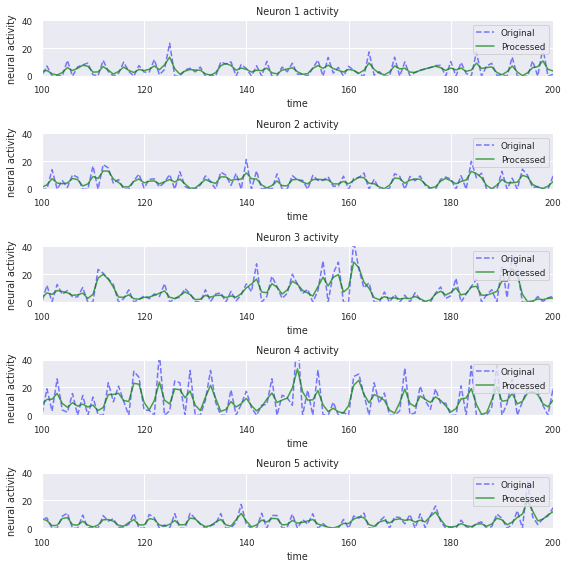

In [83]:
plt.figure(figsize=(8,8))

nrows =5

#fig, axes = plt.subplots(nrows=nrows, ncols=1, figsize=(10,10))

for idx in range(nrows):
    
    #for idx, layer in enumerate(layers):
    
    original_data = df_original['neuron_'+str(idx+1)]
    gaussian_data = df_processed['neuron_'+str(idx+1)]
    
    plt.subplot(nrows,1,idx+1)
    plt.plot(original_data,'--', color='blue',label='Original',alpha=0.5)
    plt.plot(gaussian_data,'-', color='green', label='Processed',alpha=0.7)

    plt.legend(loc='upper right')
    plt.xlim(100,200)
    plt.ylim(0,40)
    plt.xlabel('time')
    plt.ylabel('neural activity')
    plt.title('Neuron '+str(idx+1)+' activity')

In [84]:
from sklearn.decomposition import PCA

In [85]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc.fit(df_processed[neurons_names])
df_processed_std = sc.transform(df_processed[neurons_names])

pca = PCA()
pca.fit(df_processed_std)

PCA()

In [86]:
df_pca_std = pca.transform(df_processed_std)

In [87]:
# Determine explained variance using explained_variance_ration_ attribute
#
exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

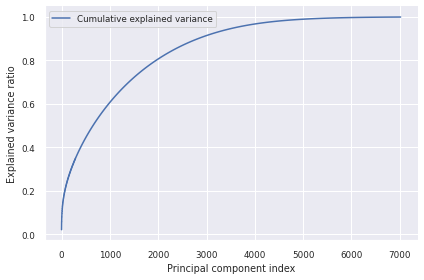

In [88]:

plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

<BarContainer object of 7018 artists>

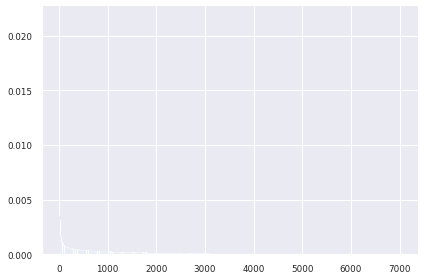

In [89]:
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')


(7018,)


Text(0.5, 1.0, 'Individual explained variance')

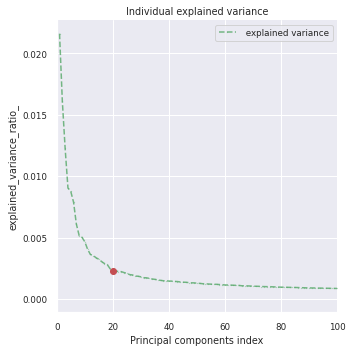

In [90]:
import numpy as np
import matplotlib.pyplot as plt

print(exp_var_pca.shape)
fig = plt.figure(figsize=(5,5))

plt.plot(range(1,len(exp_var_pca)+1),exp_var_pca,'--go',alpha = 0.8,label=' explained variance',markersize=0.2)

plt.plot(20,exp_var_pca[20],'ro')
plt.xlim(0,55) 
plt.xlabel("Principal components index")
plt.ylabel("explained_variance_ratio_")
plt.legend(loc='upper right')
plt.xlim(0,100)
plt.title('Individual explained variance')

In [91]:
df_pca_std.shape

(7018, 7018)

In [92]:
df_pca_new_data = pd.DataFrame(df_pca_std)
df_pca_new_data = df_pca_new_data.add_prefix('pca_')

pca_names = df_pca_new_data.columns
df_pca_new_data.head(2)

,pca_0,pca_1,pca_2,pca_3,pca_4,pca_5,pca_6,pca_7,pca_8,pca_9,...,pca_7008,pca_7009,pca_7010,pca_7011,pca_7012,pca_7013,pca_7014,pca_7015,pca_7016,pca_7017
0,2.626928,12.602337,2.151607,-1.448236,-2.396354,-0.971531,-1.111111,-6.559869,6.124835,4.440279,...,0.026294,-0.027603,0.005877,-0.005451,0.000379,-0.055095,0.03830,-0.016249,-0.002667,0.000001
1,10.516823,16.832218,8.343952,1.715721,-0.170598,-6.532469,-10.068234,-3.253907,7.647907,3.392980,...,-0.043125,0.040594,-0.004918,0.021720,0.014053,0.015999,-0.01313,0.027625,-0.000525,0.000002


In [93]:
df_pca_new_data['speed'] = df['speed']
df_pca_new_data['speed_level'] = df['speed_level']

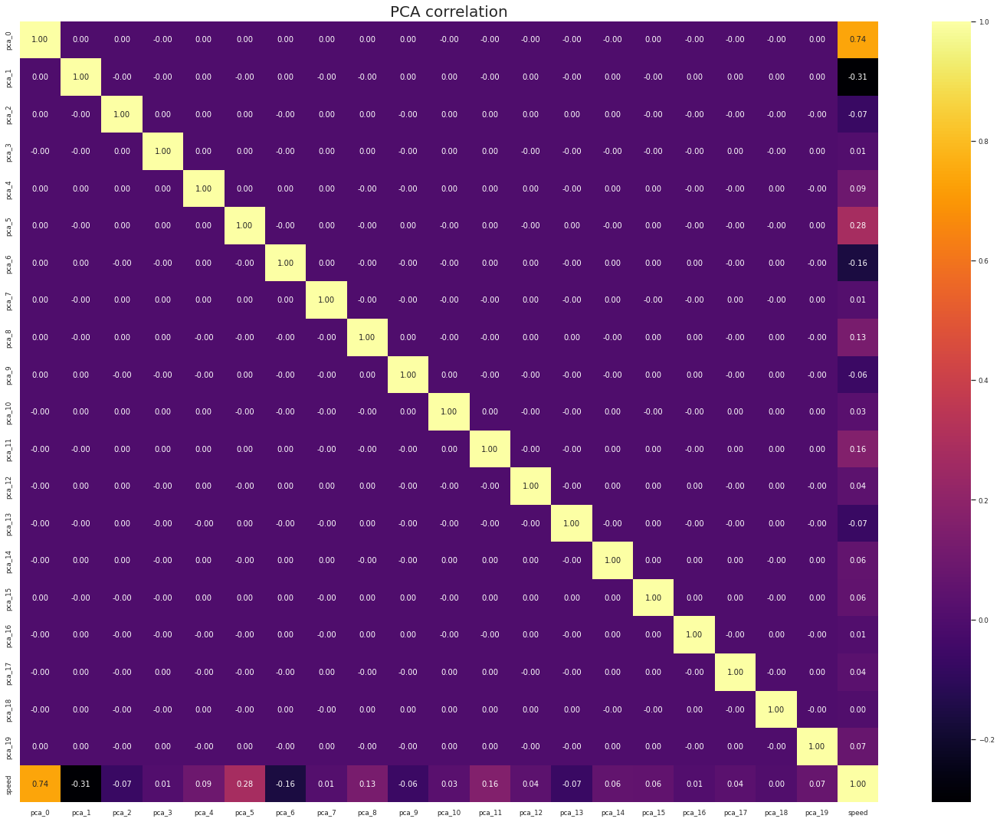

In [94]:
corr_matrix = df_pca_new_data[list(pca_names[:20])+['speed','speed_level']].corr()
fig, ax = plt.subplots(figsize=(20, 15))

ax = sns.heatmap(corr_matrix,
                 annot=True,
                 fmt=".2f",
                 cmap="inferno"); #bone cmap type

plt.title('PCA correlation', fontsize = 20)
bottom, top = ax.get_ylim()
sns.set(font_scale=0.8)


In [95]:
target_correlation = df_pca_new_data[pca_names[:20]].apply(lambda x: x.corr(df_pca_new_data['speed']))

In [96]:
target_correlation

pca_0     0.739655
pca_1    -0.305433
pca_2    -0.069788
pca_3     0.007199
pca_4     0.094482
pca_5     0.276384
pca_6    -0.159453
pca_7     0.011946
pca_8     0.132967
pca_9    -0.062413
pca_10    0.026402
pca_11    0.160744
pca_12    0.040941
pca_13   -0.068982
pca_14    0.057980
pca_15    0.055995
pca_16    0.007508
pca_17    0.035726
pca_18    0.000775
pca_19    0.073223
dtype: float64